# Model Inference

Run the cell below to load the model for infernece, then use the cells beyond to test coloring your own uploaded images

Processing images: 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


Average L1 Loss across all images: 0.09260171545403344


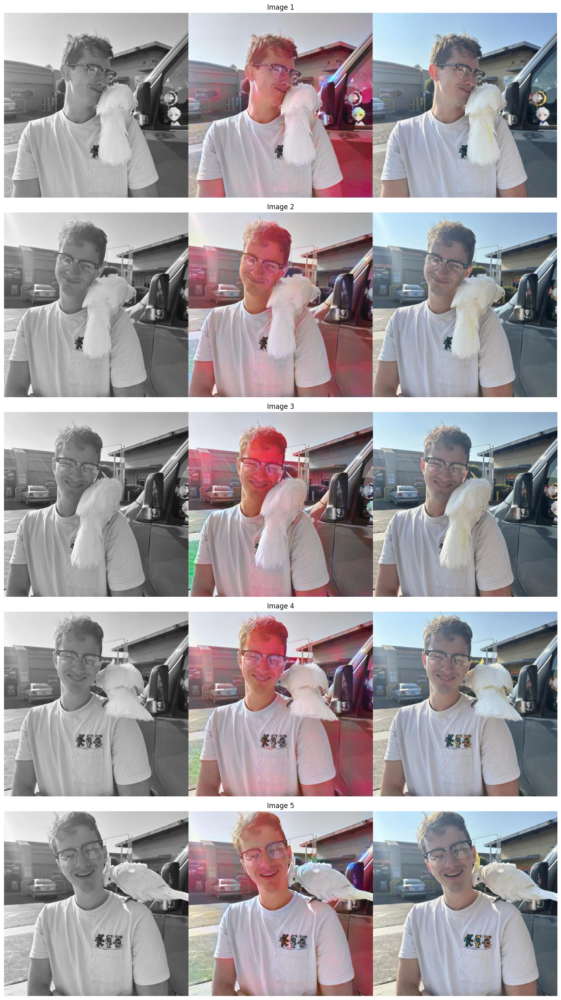

In [2]:
import torch
import torch.nn as nn
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
from unet import Unet
from utils import rgb_to_lab, lab_to_rgb

device = torch.device("cpu")
l1_loss = nn.L1Loss()


def read_and_resize_image(image_path, size=512):
    image = Image.open(image_path).convert("RGB")
    width, height = image.size
    new_size = min(width, height)
    left = (width - new_size) // 2
    top = (height - new_size) // 2
    right = left + new_size
    bottom = top + new_size
    image = image.crop((left, top, right, bottom))
    image = image.resize((size, size), Image.LANCZOS)
    return image


def preprocess_image(image):
    image_np = np.array(image).astype(np.float32)
    image_tensor = torch.from_numpy(image_np).to(device)
    l_chan, ab_chan = rgb_to_lab(image_tensor)
    return l_chan, ab_chan


def colorize_and_evaluate(model, l_chan, ab_chan):
    model.eval()
    with torch.no_grad():
        output = model(l_chan.unsqueeze(0))
        loss = l1_loss(output.squeeze(0), ab_chan)

    l_rgb = lab_to_rgb(l_chan.unsqueeze(0), torch.zeros_like(output))
    output_rgb = lab_to_rgb(l_chan.unsqueeze(0), output)
    target_rgb = lab_to_rgb(l_chan.unsqueeze(0), ab_chan.unsqueeze(0))

    l_rgb = l_rgb.squeeze().cpu().numpy()
    output_rgb = output_rgb.squeeze().cpu().numpy()
    target_rgb = target_rgb.squeeze().cpu().numpy()

    stacked_image = np.hstack((l_rgb, output_rgb, target_rgb))

    return stacked_image, loss.item()


def process_folder(model, folder_path, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    image_files = [
        f
        for f in os.listdir(folder_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]
    total_loss = 0
    for img_file in tqdm(image_files, desc="Processing images"):
        img_path = os.path.join(folder_path, img_file)
        original_image = read_and_resize_image(img_path)
        l_chan, ab_chan = preprocess_image(original_image)
        stacked_image, loss = colorize_and_evaluate(model, l_chan, ab_chan)
        total_loss += loss
        output_path = os.path.join(output_folder, f"colorized_{img_file}")
        Image.fromarray((stacked_image * 255).astype(np.uint8)).save(output_path)
    avg_loss = total_loss / len(image_files)
    return avg_loss


def load_generator_from_gan_checkpoint(checkpoint_path):
    state_dict = torch.load(checkpoint_path, map_location=device)

    if "model_state_dict" in state_dict:
        # The model was saved with the entire state dict
        gen_state_dict = {
            k.replace("net_G.", ""): v
            for k, v in state_dict["model_state_dict"].items()
            if k.startswith("net_G.")
        }
    elif "net_G" in state_dict:
        # The model was saved as part of MainModel
        gen_state_dict = state_dict["net_G"]
    else:
        # Try loading directly
        gen_state_dict = {
            k.replace("net_G.", ""): v
            for k, v in state_dict.items()
            if k.startswith("net_G.")
        }

    model = Unet().to(device)
    model.load_state_dict(gen_state_dict)
    return model


# Load the model
model = load_generator_from_gan_checkpoint("best_checkpoint_unet_gan.pth")

input_folder = "test_images"
output_folder = "test_images_output"
avg_loss = process_folder(model, input_folder, output_folder)
print(f"Average L1 Loss across all images: {avg_loss}")


def display_grid(output_folder, num_images=5):
    processed_images = [
        f for f in os.listdir(output_folder) if f.startswith("colorized_")
    ]
    num_images = min(num_images, len(processed_images))

    fig, axes = plt.subplots(num_images, 1, figsize=(15, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for i, img_file in enumerate(processed_images[:num_images]):
        img_path = os.path.join(output_folder, img_file)
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].set_title(f"Image {i+1}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()


display_grid(output_folder, num_images=5)

Finetune 3

Model best checkpoint:  0.061676306916134696

Model final checkpoint: 0.0633884487407548

---

Finetune 4

Model best checkpoint:  0.06221018039754459

Model final checkpoint: 0.05993900181991713

Processing images: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]


Average L1 Loss across all images (with attention): 0.05993900607739176


Processing images: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]


Average L1 Loss across all images (no attention): 0.07006084706102099
Results with attention:


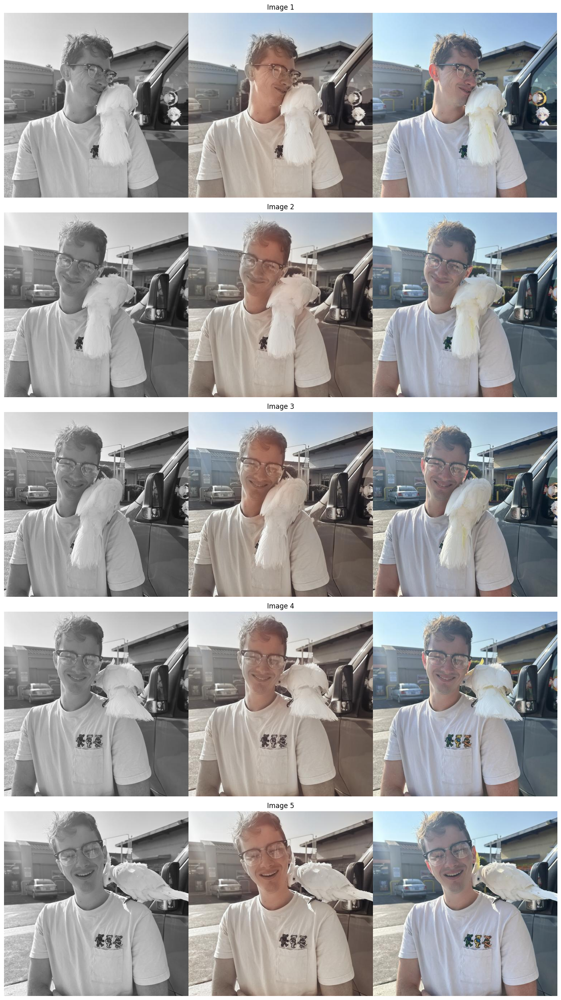

Results without attention:


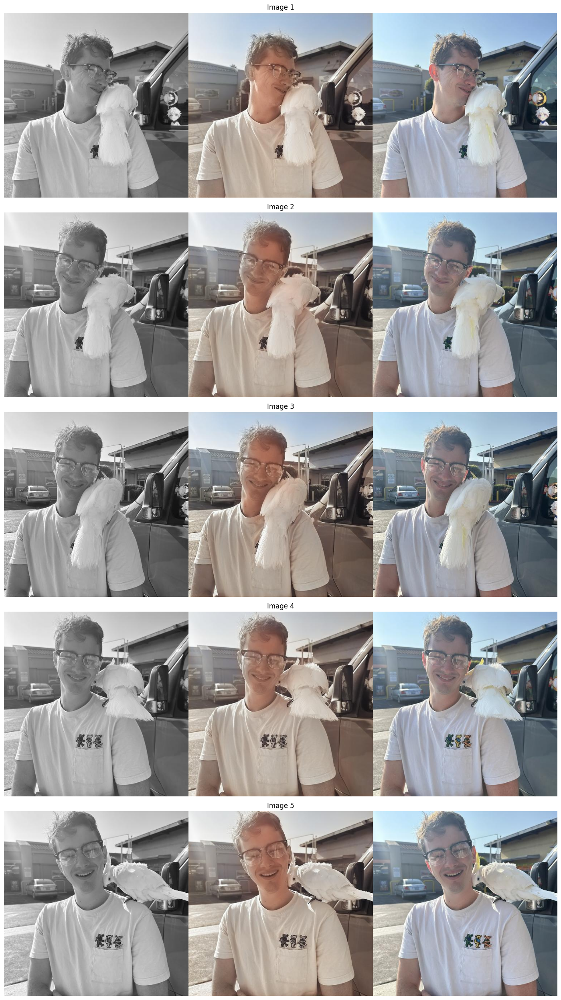

In [10]:
import torch
import torch.nn as nn
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

from unet import Unet, CrissCrossAttention
from utils import rgb_to_lab, lab_to_rgb

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

l1_loss = nn.L1Loss()

def read_and_resize_image(image_path, size=512):
    image = Image.open(image_path).convert("RGB")
    width, height = image.size
    new_size = min(width, height)
    left = (width - new_size) // 2
    top = (height - new_size) // 2
    right = left + new_size
    bottom = top + new_size
    image = image.crop((left, top, right, bottom))
    image = image.resize((size, size), Image.LANCZOS)
    return image

def preprocess_image(image):
    image_np = np.array(image).astype(np.float32)
    image_tensor = torch.from_numpy(image_np).to(device)
    
    l_chan, ab_chan = rgb_to_lab(image_tensor)
    return l_chan, ab_chan

def colorize_and_evaluate(model, l_chan, ab_chan):
    model.eval()
    with torch.no_grad():
        output = model(l_chan.unsqueeze(0))
        loss = l1_loss(output.squeeze(0), ab_chan)
    
    l_rgb = lab_to_rgb(l_chan.unsqueeze(0), torch.zeros_like(output))
    output_rgb = lab_to_rgb(l_chan.unsqueeze(0), output)
    target_rgb = lab_to_rgb(l_chan.unsqueeze(0), ab_chan.unsqueeze(0))
    
    l_rgb = l_rgb.squeeze().cpu().numpy()
    output_rgb = output_rgb.squeeze().cpu().numpy()
    target_rgb = target_rgb.squeeze().cpu().numpy()
    
    stacked_image = np.hstack((l_rgb, output_rgb, target_rgb))
    
    return stacked_image, loss.item()

def process_folder(model, folder_path, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg'))]
    total_loss = 0

    for img_file in tqdm(image_files, desc="Processing images"):
        img_path = os.path.join(folder_path, img_file)
        original_image = read_and_resize_image(img_path)
        l_chan, ab_chan = preprocess_image(original_image)

        stacked_image, loss = colorize_and_evaluate(model, l_chan, ab_chan)
        total_loss += loss

        output_path = os.path.join(output_folder, f"colorized_{img_file}")
        Image.fromarray((stacked_image * 255).astype(np.uint8)).save(output_path)

    avg_loss = total_loss / len(image_files)
    return avg_loss

def display_grid(output_folder, num_images=5):
    processed_images = [f for f in os.listdir(output_folder) if f.startswith("colorized_")]
    num_images = min(num_images, len(processed_images))
    
    fig, axes = plt.subplots(num_images, 1, figsize=(15, 5*num_images))
    if num_images == 1:
        axes = [axes]
    
    for i, img_file in enumerate(processed_images[:num_images]):
        img_path = os.path.join(output_folder, img_file)
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].set_title(f"Image {i+1}")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

def disable_attention(model):
    for module in model.modules():
        if isinstance(module, CrissCrossAttention):
            module.gamma.data.fill_(0)
    return model

def evaluate_model(model, input_folder, output_folder):
    model.eval()
    for param in model.parameters():
        param.requires_grad = False
    avg_loss = process_folder(model, input_folder, output_folder)
    return avg_loss

# Load the model
model = Unet().to(device)
model.load_state_dict(torch.load("unet_attn_final_finetune/model_unet_final.pth", map_location=device))

# Evaluate with attention
input_folder = "test_images"
output_folder_with_attention = "test_images_output_with_attention"
avg_loss_with_attention = evaluate_model(model, input_folder, output_folder_with_attention)

print(f"Average L1 Loss across all images (with attention): {avg_loss_with_attention}")

# Disable attention and evaluate again
model = disable_attention(model)
output_folder_no_attention = "test_images_output_no_attention"
avg_loss_no_attention = evaluate_model(model, input_folder, output_folder_no_attention)

print(f"Average L1 Loss across all images (no attention): {avg_loss_no_attention}")

# Display results
print("Results with attention:")
display_grid(output_folder_with_attention, num_images=5)
print("Results without attention:")
display_grid(output_folder_no_attention, num_images=5)

In [3]:

class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2),
            nn.SiLU(inplace=True),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.SiLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),

            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.SiLU(inplace=True),
            nn.Conv2d(32, 16, kernel_size=3, padding=1),
            nn.SiLU(inplace=True),

            nn.Conv2d(16, 3, kernel_size=3, padding=1),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

model = ConvNet()

# counmt the number of parameters
num_params = sum(p.numel() for p in model.parameters())

In [5]:
model

ConvNet(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): SiLU(inplace=True)
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): SiLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): SiLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): SiLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): SiLU(inplace=True)
    (12): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): SiLU(inplace=True)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2),

In [7]:
import torch
from torch import nn
import torch.nn.functional as F


class CrissCrossAttention(nn.Module):
    def __init__(self, in_dim):
        super().__init__()
        self.channel_in = in_dim
        self.channel_out = in_dim // 8
        # Combined QKV projection
        self.qkv_conv = nn.Conv2d(in_dim, 3 * self.channel_out, 1)

        self.gamma = nn.Parameter(torch.zeros(1))
        self.out_conv = nn.Conv2d(in_dim // 8, in_dim, 1)

    def forward(self, x):
        B, C, H, W = x.size()
        
        # Combined QKV projection
        qkv = self.qkv_conv(x)
        query, key, value = qkv.chunk(3, dim=1)
        
        # Horizontal attention
        query_h = query.permute(0, 3, 1, 2).contiguous().view(B*W, self.channel_out, H)
        key_h = key.permute(0, 3, 1, 2).contiguous().view(B*W, self.channel_out, H)
        value_h = value.permute(0, 3, 1, 2).contiguous().view(B*W, self.channel_out, H)
        
        energy_h = torch.bmm(query_h, key_h.transpose(1, 2))
        attn_h = F.softmax(energy_h, dim=-1)
        out_h = torch.bmm(attn_h, value_h)
        
        # Vertical attention
        query_v = query.permute(0, 2, 1, 3).contiguous().view(B*H, self.channel_out, W)
        key_v = key.permute(0, 2, 1, 3).contiguous().view(B*H, self.channel_out, W)
        value_v = value.permute(0, 2, 1, 3).contiguous().view(B*H, self.channel_out, W)
        
        energy_v = torch.bmm(query_v, key_v.transpose(1, 2))
        attn_v = F.softmax(energy_v, dim=-1)
        out_v = torch.bmm(attn_v, value_v)
        
        # Reshape and combine
        out_h = out_h.view(B, W, self.channel_out, H).permute(0, 2, 3, 1)
        out_v = out_v.view(B, H, self.channel_out, W).permute(0, 2, 1, 3)
        
        out = out_h + out_v
        out = self.gamma * out
        
        # Project back to the original channel dimension
        out = self.out_conv(out)
        
        return out + x


class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4, stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4, stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4, stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4, stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        
        self.model = nn.Sequential(*model)
        self.use_attention = not outermost and nf <= 512
        if self.use_attention:
            self.attention = CrissCrossAttention(nf)
        
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            output = self.model(x)
            if self.use_attention:
                output = self.attention(output)
            return torch.cat([x, output], 1)


class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)

        for i in range(n_down - 5):
            unet_block = UnetBlock(
                num_filters * 8, num_filters * 8, submodule=unet_block, dropout=False
            )

        out_filters = num_filters * 8
        for i in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2

        self.model = UnetBlock(
            output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True
        )

    def forward(self, x):
        return self.model(x)

model = Unet()

# counmt the number of parameters
sum(p.numel() for p in model.parameters())

54980593